# Домашнее задание №2

Задание присылать на почту aleksartamonov@gmail.com в виде ссылки на colab

В теме письма указать **CV_PANDAN_2021 HW2 <Фамилия Имя>**

soft deadline: 08.03.2021T23:59:00+0300

hard deadline: 14.03.2021T23:59:00+0300

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/hw2

/content/drive/.shortcut-targets-by-id/1Q4WEGTjMUD6PL7F_jH_xsHpf9R0XT5j6/hw2


In [3]:
import ipywidgets as widgets
from ipywidgets import interactive
from IPython.display import display, clear_output

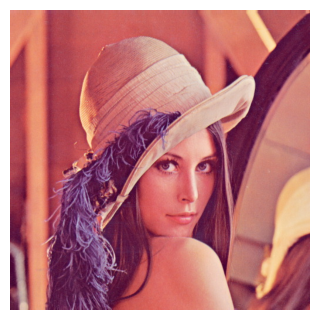

In [4]:
import cv2
import matplotlib.pylab as plt
import numpy as np
%matplotlib inline
plt.style.use('default')

def show(img, size=3):
    plt.figure(figsize=(size,size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

lena = cv2.imread("lena.jpg")
show(lena)

**1. (5 баллов)** С помощью [виджетов](http://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html) создайте 2 слайдера с настройками параметров гамма-коррекции. Отобразите **lena**, ее гамма-преобразование и график в диапозоне от [0;1], так, чтобы параметры слайдера соответствовали параметрам гамма-коррекции. 

In [5]:
def gamma_correction(image, c, gamma):
    table = np.array([255 * c * (i / 255.0) ** (1.0 / gamma) for i in range(0, 256)]).clip(0,255).astype('uint8')
    return cv2.LUT(image, table)

def plot_gamma_curve(c, gamma):
    x = np.linspace(0, 1, 100)
    y = c * x ** gamma

    plt.plot(x, y, label='gamma')
    plt.plot(x, x, label='image')
    plt.title(f'{c} * x ^ {gamma}')
    plt.legend()
    plt.show()

In [6]:
def gamma_image(c, gamma):
    gamma_lena = gamma_correction(lena, c, gamma)

    lena_stacked = np.hstack([lena, gamma_lena])

    show(lena_stacked, size=6)
    plot_gamma_curve(c, gamma)

In [7]:
interactive(gamma_image, c=(0, 1, 0.1), gamma=(0, 5, 0.1))

interactive(children=(FloatSlider(value=0.0, description='c', max=1.0), FloatSlider(value=2.0, description='ga…

**2. (5 баллов)** Загрузите изображение $lena.jpg$. Переведите изображение в градации серого. Примените к серому изображению операцию линейного растяжения диапазона яркостей ($normalize$) и эквализации гистограммы ($equalizeHist$). Постройте разность полученных результатов. Состыкуйте в одно изображение в градациях серого результат линейного растяжения, эквализации и их разности.

In [8]:
def normalize(image):
    y_min, y_max = image.min(), image.max()
    new_image = ((image - y_min) / (y_max - y_min) * 255).astype('uint8')
    
    return new_image

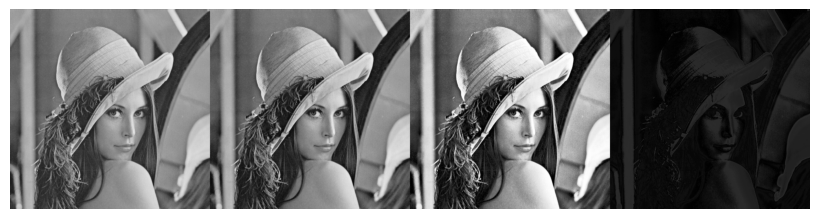

In [9]:
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
lena_norm = normalize(lena_gray)
lena_equal = cv2.equalizeHist(lena_gray)
lena_dif = cv2.absdiff(lena_equal, lena_norm)

lena_stacked = np.hstack([lena_gray, lena_norm, lena_equal, lena_dif])

show(lena_stacked, size=8)

**3. (5 баллов)** Реализуйте функцию добавления шума «соль и перец» для одноканального изображения. Входные параметры: $src$ – исходная одноканальная матрица $Mat$, $p$ – вероятность замещения исходных значений на $0$, $q$ – вероятность замещения исходных значений на $255$. Загрузите изображение $lena.jpg$, выделите каналы изображения в отдельные матрицы ($split$), добавьте шум «соль и перец» в каждый канал при помощи реализованной Вами функции с параметрами

1. $p=q=0.05$
2. $p=q=0.1$
3. $p=q=0.15$

In [10]:
def salt_pepper(src, p=0.05, q=0.05):
    new_src = src.copy()

    n = src.shape[0] * src.shape[1]
    n_p = int(n * p)
    n_q = int(n * q)

    for i in range(n_p):
        y = np.random.randint(0, src.shape[0])
        x = np.random.randint(0, src.shape[1])

        new_src[y, x] = 0

    for i in range(n_q):
        y = np.random.randint(0, src.shape[0])
        x = np.random.randint(0, src.shape[1])

        new_src[y, x] = 255

    return new_src

In [11]:
def add_noice(image, p=0.05, q=0.05):
    r, g, b = cv2.split(image)

    new_r = salt_pepper(r, p, q)
    new_g = salt_pepper(g, p, q)
    new_b = salt_pepper(b, p, q)

    new_image = cv2.merge([new_r, new_g, new_b])
    return new_image

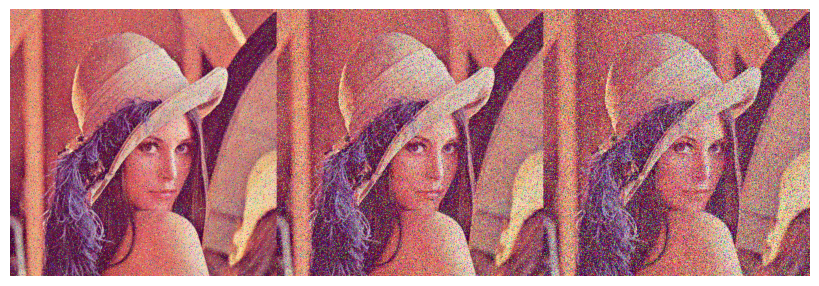

In [12]:
lena_1 = add_noice(lena, 0.05, 0.05)
lena_2 = add_noice(lena, 0.1, 0.1)
lena_3 = add_noice(lena, 0.15, 0.15)

lena_stacked = np.hstack([lena_1, lena_2, lena_3])
show(lena_stacked, size=8)

**4. (5 баллов)** Подавите шум на изображении $lena\_color\_512\_noise.tif$. Вычислите среднеквадратичную ошибку ($MSE$) для полученного результата и изображения $lena\_color\_512.tif$. Задача будет засчитана при $MSE < 150$. Тот, у кого по результатам проверки будет наименьшее значение $MSE$ среди всех студентов для этой задачи, получит призовую шоколадку.

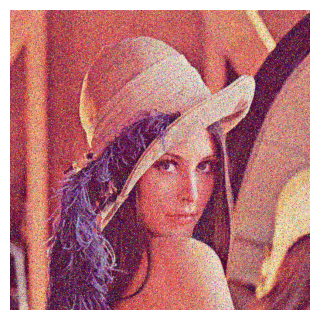

In [155]:
img = cv2.imread("lena_color_512-noise.tif")
true_img = cv2.imread('lena_color_512.tif')

show(img)

55.91059239705404


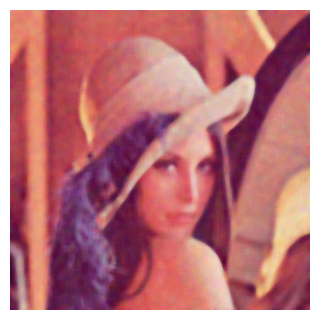

In [159]:
unnoiced_img = cv2.medianBlur(img, 11)

mse = np.mean((cv2.absdiff(unnoiced_img, true_img)) ** 2)
print(mse)

show(unnoiced_img)

**5. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

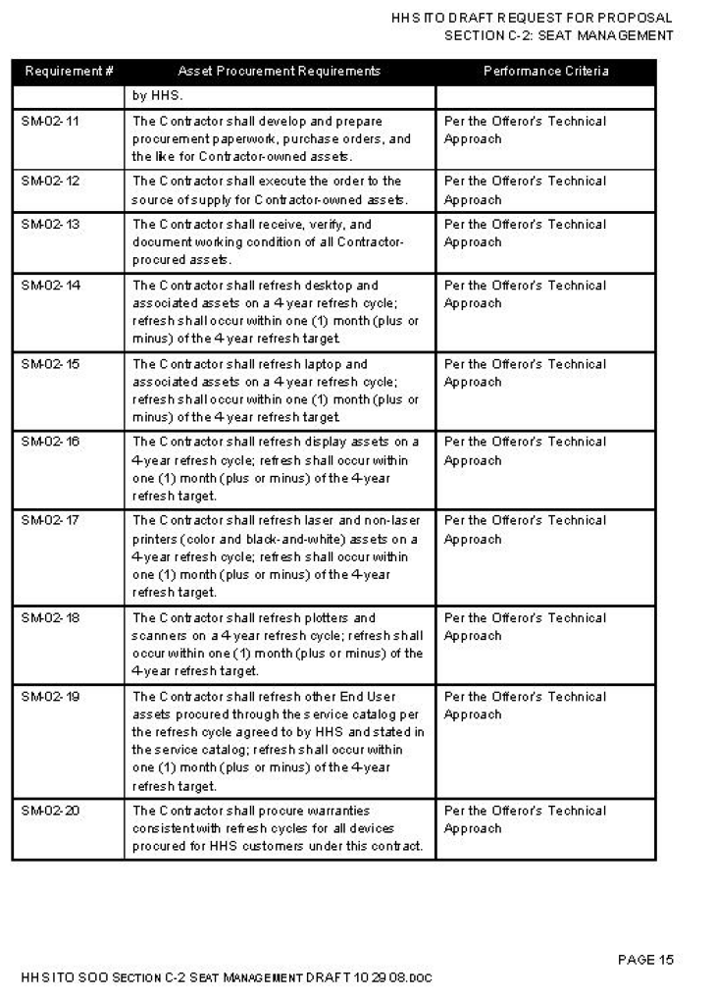

In [15]:
table = cv2.imread("table.jpg")
show(table, size=10)

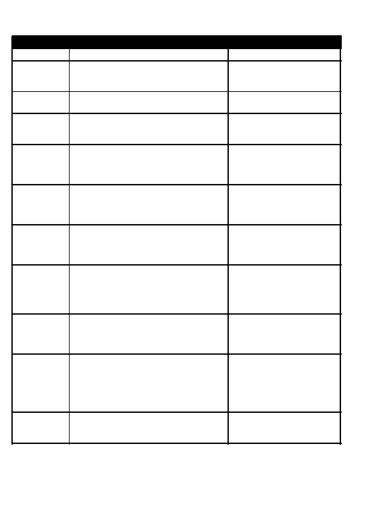

In [16]:
new_table = table.copy()

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
new_table = cv2.erode(new_table, kernel, iterations=1)
new_table = cv2.dilate(new_table, kernel, iterations=1)

gray = cv2.cvtColor(new_table, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

kernel_vert = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 30))
vertical = cv2.erode(thresh, kernel_vert, iterations=1)
vertical = cv2.dilate(vertical, kernel_vert, iterations=1)

kernel_hor = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 1))
horizontal = cv2.erode(thresh, kernel_hor, iterations=1)
horizontal = cv2.dilate(horizontal, kernel_hor, iterations=1)

new_table = 255 - cv2.bitwise_or(vertical, horizontal)

show(new_table, size=5)

**6. (5 баллов)** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

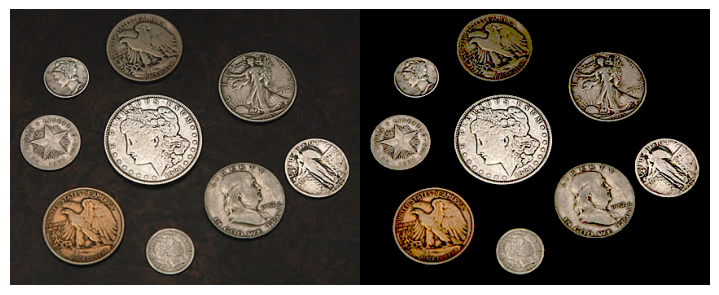

In [17]:
coins_1 = cv2.imread("coins_1.jpg")

no_back = coins_1.copy()
no_back[no_back < 79] = 0

coins_stacked = np.hstack([coins_1, no_back])

show(coins_stacked, size=7)

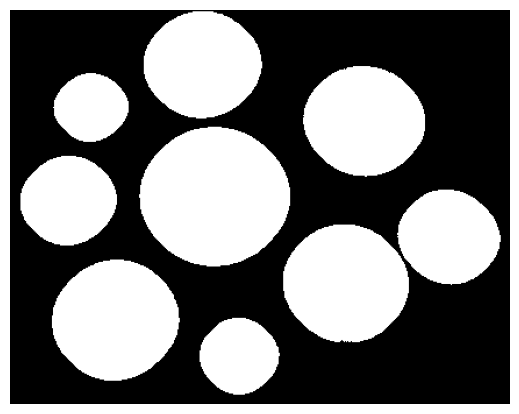

In [18]:
thresh = cv2.cvtColor(no_back, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(thresh, 0, 255, cv2.THRESH_BINARY)[1]

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
new_img = cv2.erode(thresh, kernel, iterations=1)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
new_img = cv2.dilate(new_img, kernel, iterations=5)

show(new_img, size=5)

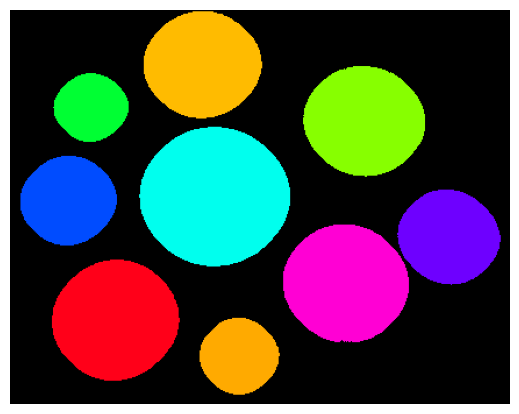

In [19]:
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(new_img)
areas = stats.T[4]
centroids = centroids.astype('int32')

label_hue = (200 * labels / np.max(labels)).astype('uint8')
blank_ch = 255 * np.ones_like(label_hue)

labeled_img = cv2.merge([label_hue, blank_ch, blank_ch])
labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_HSV2BGR)
labeled_img[label_hue == 0] = 0

show(labeled_img, size=5)

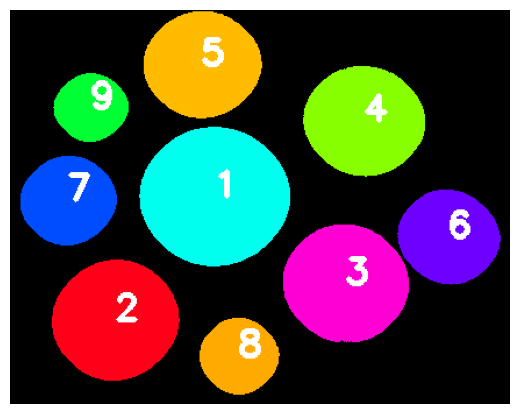

In [20]:
ordered_labels = {k: v for k, v in zip(np.argsort(areas)[::-1], np.arange(len(labels)))}

number_img = labeled_img.copy()

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 1
fontColor = (255, 255, 255)
lineType = 3

for label in range(1, num_labels):
    number = ordered_labels[label]
    x, y = centroids[label]

    number_img = cv2.putText(number_img, str(number), (x, y), 
                             font, fontScale, fontColor, lineType)

show(number_img, size=5)


**7. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгенерируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

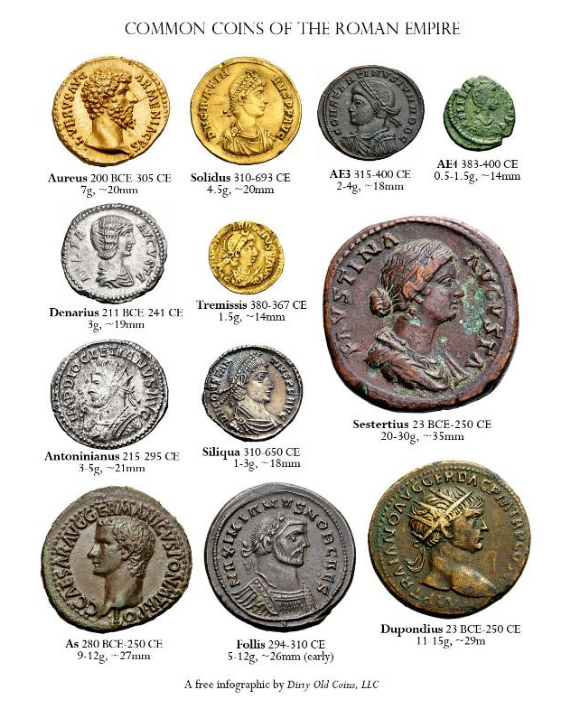

In [21]:
coins_2 = cv2.imread("coins_2.jpg")
show(coins_2, size=7)

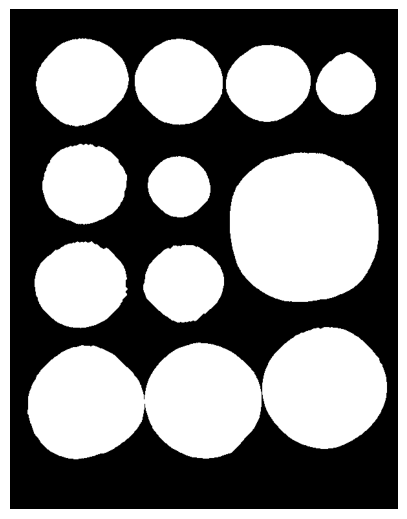

In [22]:
new_img = cv2.cvtColor(coins_2, cv2.COLOR_BGR2GRAY)
new_img = cv2.threshold(new_img, 240, 255, cv2.THRESH_BINARY_INV)[1]

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
new_img = cv2.morphologyEx(new_img, cv2.MORPH_OPEN, kernel)
new_img = cv2.morphologyEx(new_img, cv2.MORPH_CLOSE, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
new_img = cv2.morphologyEx(new_img, cv2.MORPH_OPEN, kernel, iterations=3)
new_img = cv2.dilate(new_img, kernel, iterations=6)
new_img = cv2.morphologyEx(new_img, cv2.MORPH_OPEN, kernel, iterations=3)

new_img = cv2.cvtColor(new_img, cv2.COLOR_GRAY2BGR)
show(new_img, size=5)

[  0 255]


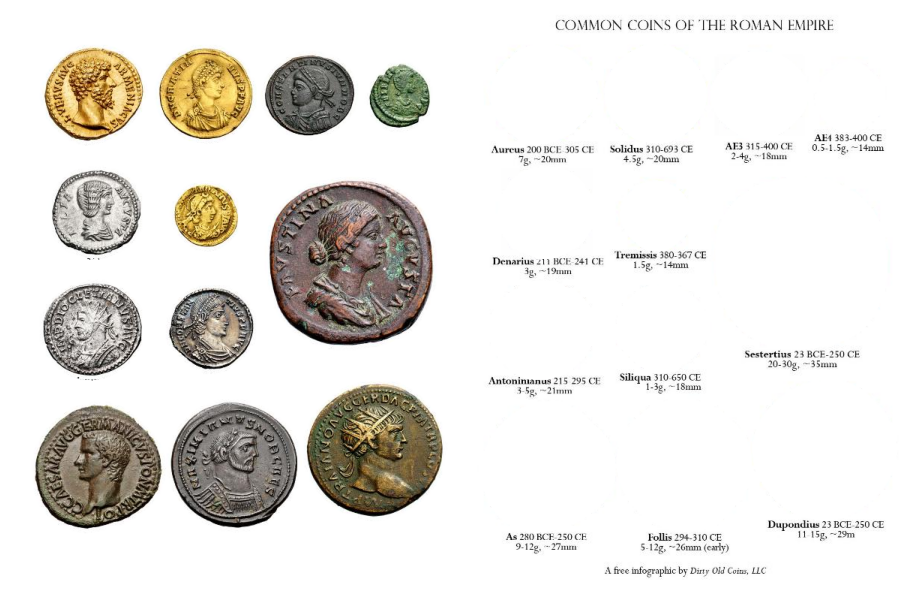

In [23]:
print(np.unique(new_img))
mask = new_img.copy()
inv_mask = cv2.bitwise_not(mask)

only_coins = cv2.subtract(mask, coins_2)
only_coins = cv2.bitwise_not(only_coins)

only_text = cv2.subtract(inv_mask, coins_2)
only_text = cv2.bitwise_not(only_text)


stacked_imgs = np.hstack([only_coins, only_text])
show(stacked_imgs, size=9)

**8. (10 баллов)** Посмотрите на изображения в папке *Coral*. Посчитайте гистограммы изображений. Выведите на экран 20 пар изображений с максимально похожими гистограммами. В этом задании надо попробовать:
* различные цветовые пространства (RGB, HSV, CIELab)
* различные способы разбиения на бины (разное количество для каждой характеристики)
* различные метрики сравнения $L_2$, $\chi^2$, пересечение гистограм

Приведите результат для лучшей комбинации признаков.

In [209]:
def show_pair(img_1, img_2, size=5):
    f = plt.figure(figsize=(size,size))

    f.add_subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    f.add_subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB))

    plt.axis('off')
    plt.show(block=True)

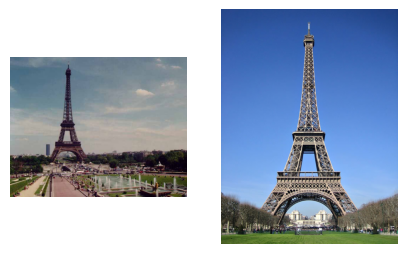

In [210]:
path = 'datasets/Corel/'

img_1 = cv2.imread(path + "eiffel.jpg")
img_2 = cv2.imread(path + "eiffel-tower-day.jpg")

show_pair(img_1, img_2)

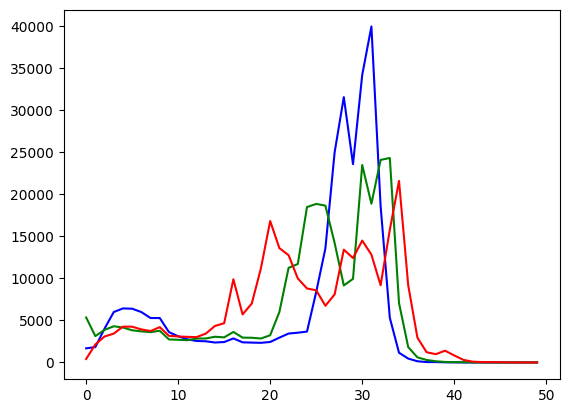

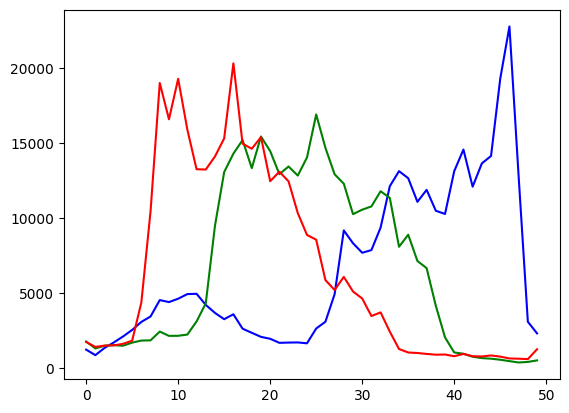

In [211]:
def plot_rgb_hist(img, bins=256):
    color = ('b','g','r')
    plt.figure()
    for i, col in enumerate(color):
        histr = cv2.calcHist([img], [i], None, [bins], [0, 256])
        plt.plot(histr, color = col)
    
    plt.show()

plot_rgb_hist(img_1, 50) 
plot_rgb_hist(img_2, 50) 

In [212]:
def inter_dist(img_hist_1, img_hist_2):
    hist_stack = np.vstack([img_hist_1, img_hist_2]).T
    result = 1 - np.sum(hist_stack.min(axis=1))

    return result

def chi2_dist(img_hist_1, img_hist_2):
    result = 0.5 * np.sum((img_hist_1 - img_hist_2) ** 2 / (img_hist_1 + img_hist_2 + 1e-15))

    return result

def l2_dist(img_hist_1, img_hist_2):
    result = np.mean((img_hist_1 - img_hist_2) ** 2)

    return result

def find_distance(img_1, img_2, bins=100, dist='chi-squared', color='rgb'):
    if dist == 'intersection':
        dist_function = inter_dist
    elif dist == 'chi2':
        dist_function = chi2_dist
    elif dist == 'l2':
        dist_function = l2_dist

    if color == 'rgb':
        img_1_color = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
        img_2_color = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)
    elif color == 'hsv':
        img_1_color = cv2.cvtColor(img_1, cv2.COLOR_BGR2HSV)
        img_2_color = cv2.cvtColor(img_2, cv2.COLOR_BGR2HSV)
    elif color == 'cie':
        img_1_color = cv2.cvtColor(img_1, cv2.COLOR_BGR2Lab)
        img_2_color = cv2.cvtColor(img_2, cv2.COLOR_BGR2Lab)

    final_distance = 0
    colors = [0, 1, 2]

    for i in colors:
        img_hist_1 = cv2.calcHist([img_1_color], [i], None, [bins], [0, 256]).reshape(1, -1)[0]
        img_hist_1 = img_hist_1 / np.sum(img_hist_1)

        img_hist_2 = cv2.calcHist([img_2_color], [i], None, [bins], [0, 256]).reshape(1, -1)[0]
        img_hist_2 = img_hist_2 / np.sum(img_hist_2)

        distance = dist_function(img_hist_1, img_hist_2)
        final_distance += distance / len(colors)

    return final_distance

In [214]:
import os

imgs = os.listdir(path)
distances = []

read_imgs = []
for image in imgs:
    img = cv2.imread(path + image)
    read_imgs.append(img)

In [215]:
def n_best_images(read_imgs, n_best=20, n_bins=100, dist='chi2', color='rgb'):
    distances = []
    
    for i in range(len(read_imgs)):
        for j in range(i + 1, len(read_imgs)):
            img_1 = read_imgs[i]
            img_2 = read_imgs[j]

            distance = find_distance(img_1, img_2, bins=n_bins, dist=dist, color=color)
            distances.append((i, j, distance))

    sorted_dist = sorted(distances, key=lambda x: x[2])

    return sorted_dist[:n_best]

In [224]:
def show_n_best(n_best, read_imgs):
    for i, j, _ in n_best:
        show_pair(read_imgs[i], read_imgs[j])

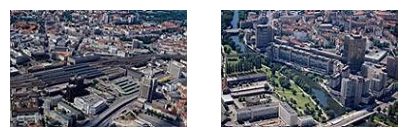

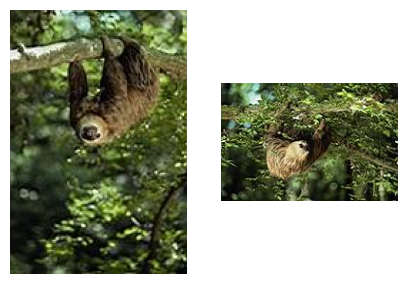

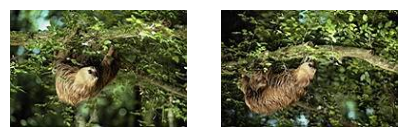

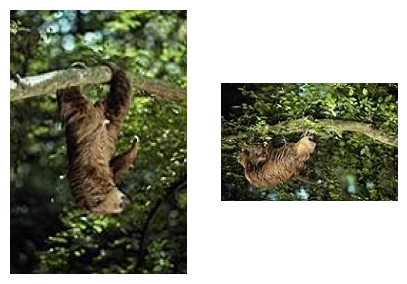

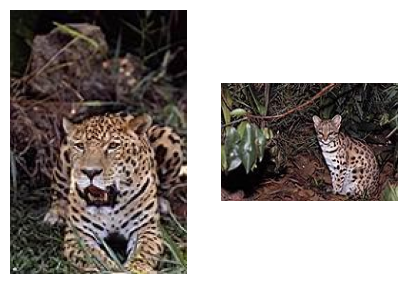

In [226]:
show_n_best(n_best_images(read_imgs, 5, n_bins=100), read_imgs)

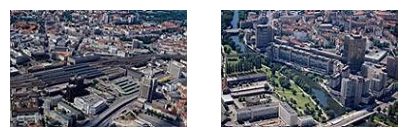

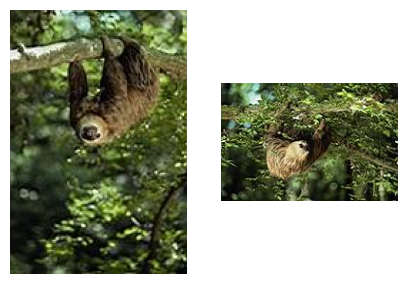

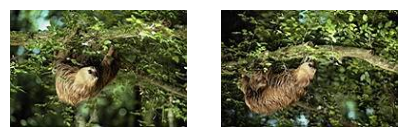

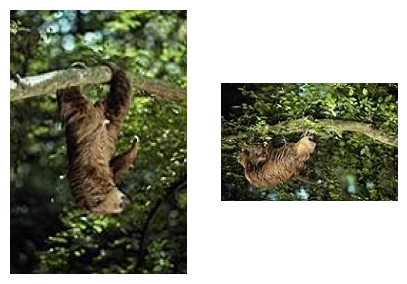

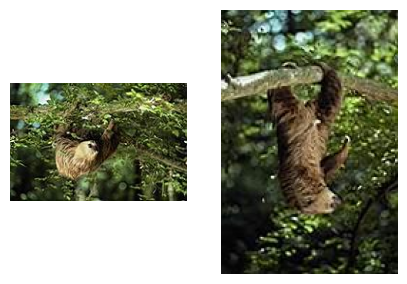

In [227]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250), read_imgs)

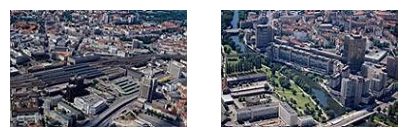

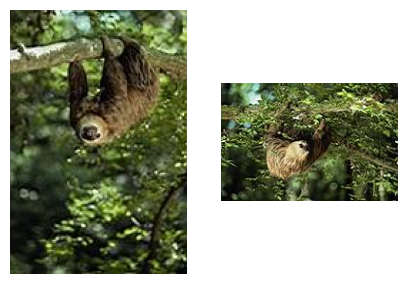

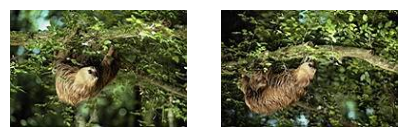

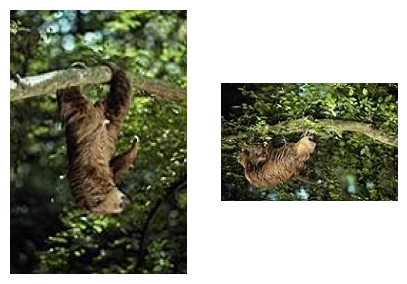

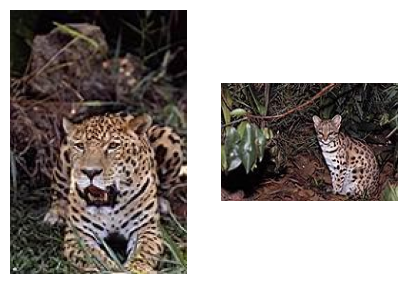

In [228]:
show_n_best(n_best_images(read_imgs, 5, n_bins=50), read_imgs)

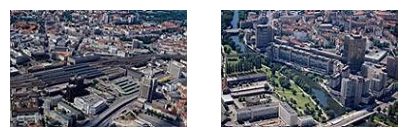

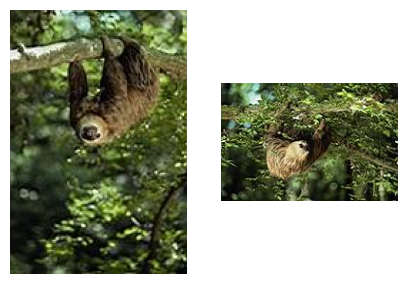

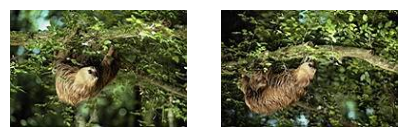

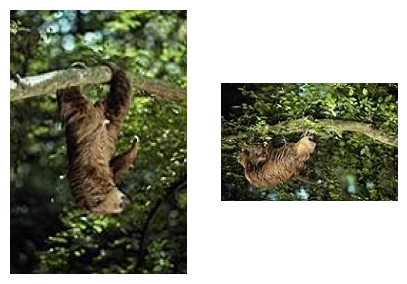

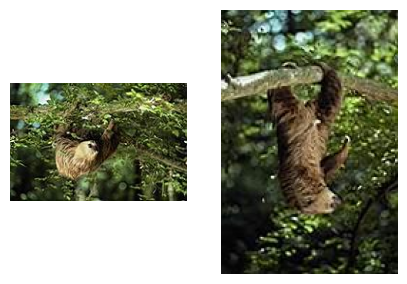

In [229]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='intersection'), read_imgs)

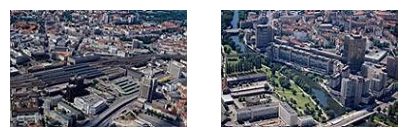

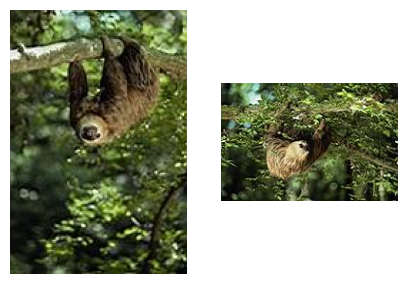

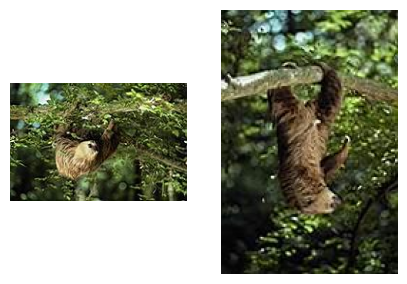

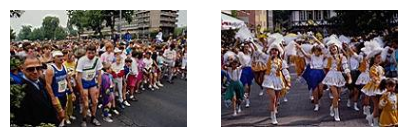

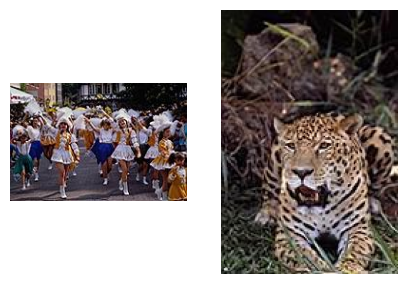

In [230]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='l2'), read_imgs)

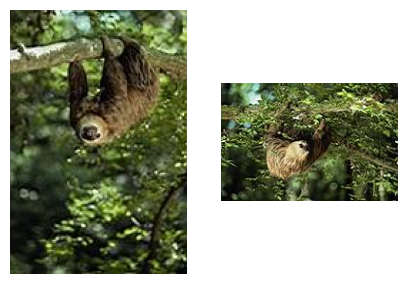

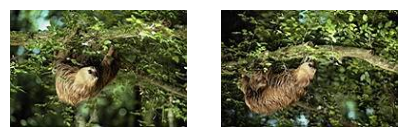

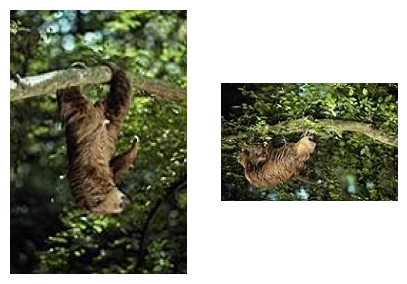

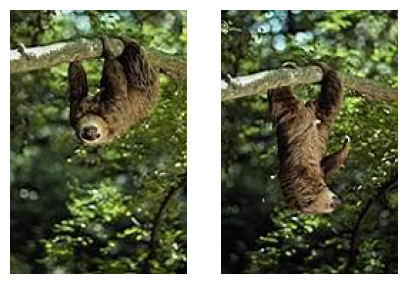

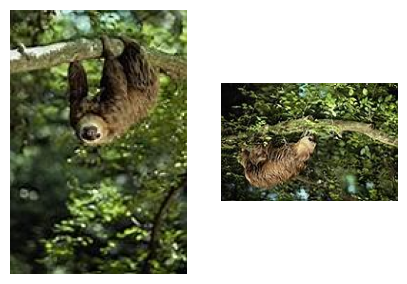

In [231]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='chi2', color='hsv'), read_imgs)

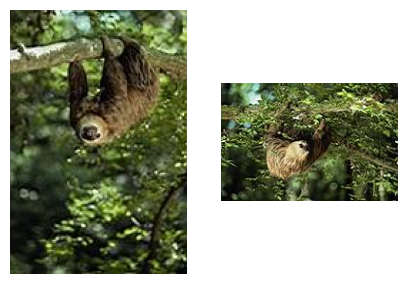

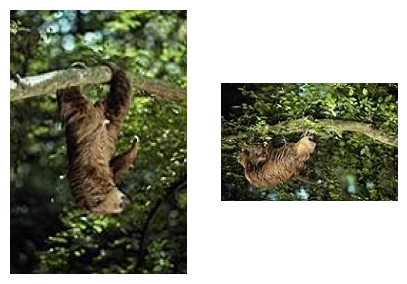

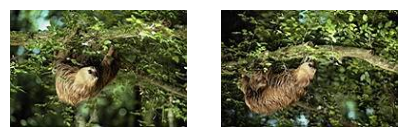

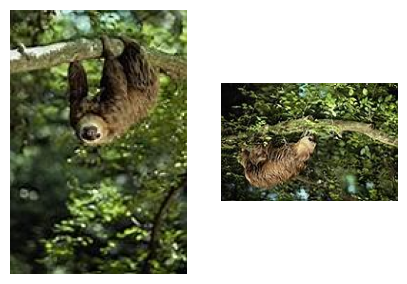

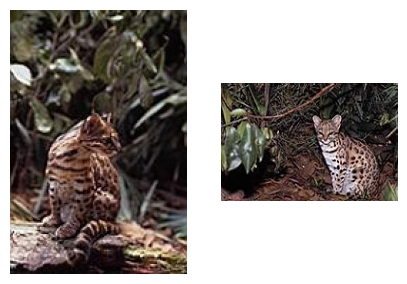

In [232]:
show_n_best(n_best_images(read_imgs, 5, n_bins=250, dist='intersection', color='cie'), read_imgs)

Best:

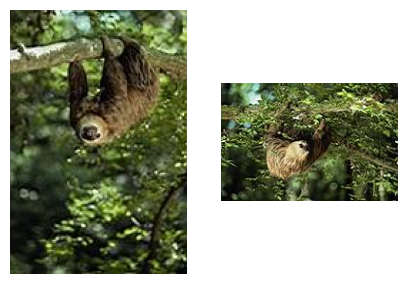

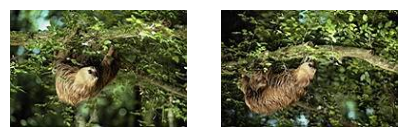

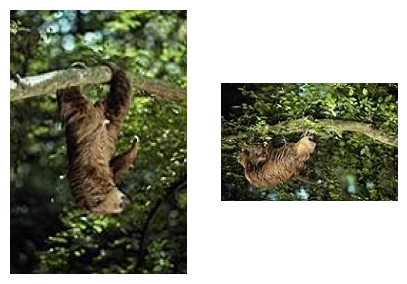

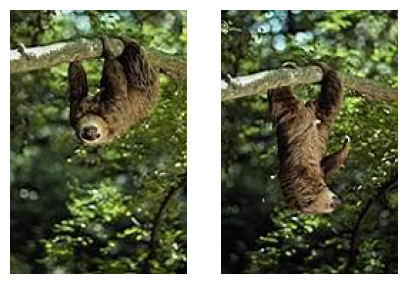

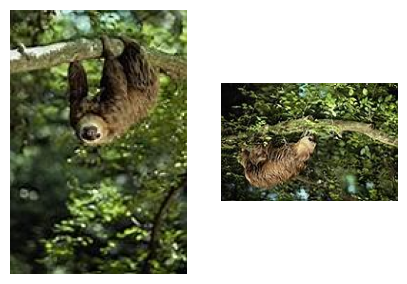

...

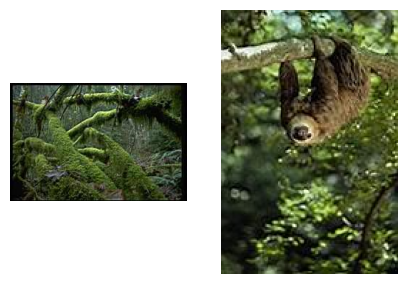

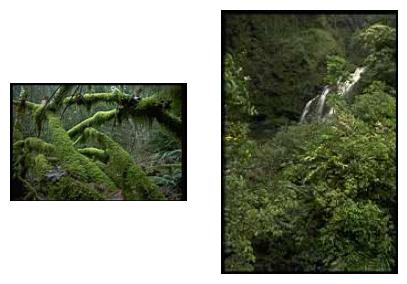

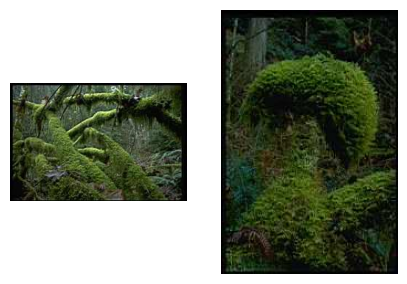

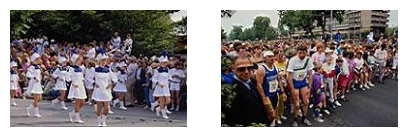

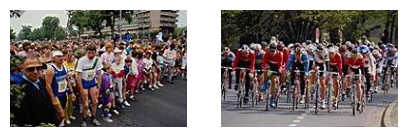

In [234]:
show_n_best(n_best_images(read_imgs, 20, n_bins=250, dist='chi2', color='hsv'), read_imgs)